In [1]:
import numpy as np
import pandas as pd
from csv import DictReader, reader
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk import pos_tag
from wordcloud import WordCloud, STOPWORDS
import warnings
warnings.filterwarnings('ignore')

<img src="imgs/philosophy.jpg" width=800 height=300 />

### Silvia (Vasiliki) Vlachou (vv2340)

# Evolution of Philoshopical Ideas

Philosophy comes from the greek words “philo” (love) and “sophia” (wisdom). The study of philosophy is of enormous interest, since its evolution reflects the evolution of ideas, beliefs, and the human existence in general. So, we are going to discuss the evolution of philosophy over time. Our goal is to eventually answer the following questions:
- Which are the main ideas and characteristics of each school of thought?
- Are there similarities between different schools?
- How have people’s emotions towards specific topics (e.g., god, mind, soul) changed over time?

### Data

At this point, it should be mentioned that for our analysis we used the dataset from the [Philosophy Data Project](http://philosophydata.com/index.html).
The dataset contains 396,427 sentences from over 69 texts spanning 18 major schools of philosophy. The following schools are represented: plato, aristotle, empiricism, rationalism, analytic, continental, phenomenology, german_idealism, communism, capitalism, stoicism, nietzsche, feminism, scholasticism, Kierkegaard, Hobbes, Existentialism, Daoism.

In [2]:
raw_df = pd.read_csv('../data/philosophy_data.csv')

In [302]:
#raw_df

### Initial analysis

Although the story of philoshopy starts hundrends of years before Christ, the first philosophical texts in this dataset are from 350BC, when the Greek philosopher Plato founded a school of thought that is named after him. From the following graph it is evident that there is a huge decrease in the number of philosophical publications around the Middle Ages, which makes sense considering that at that time life was particularly hard. After the onset of Renaissance, philosophy started burgeoning again with multiple schools being founded.

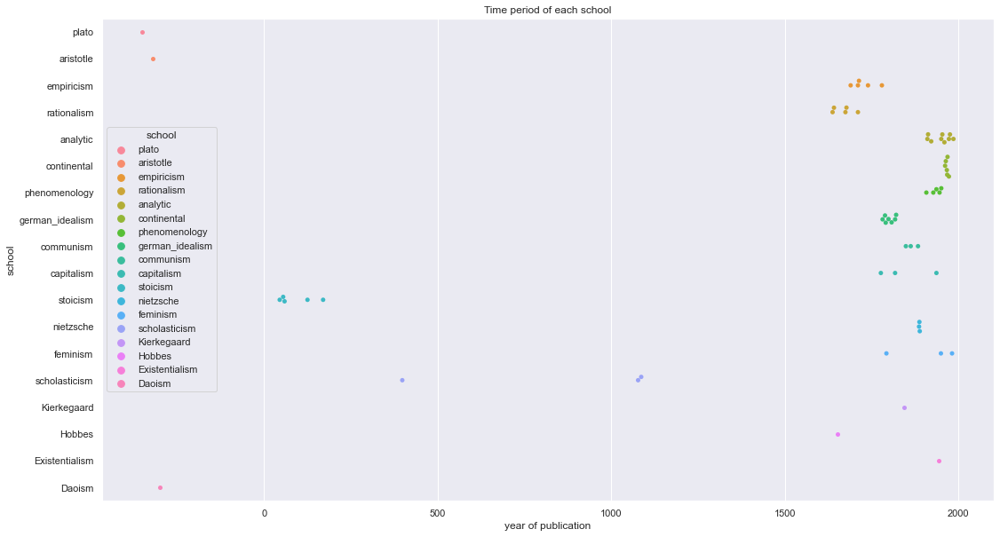

In [641]:
dataset_sorted = raw_df.sort_values(by=['original_publication_date'])
years_per_school = raw_df.loc[:, ['school', 'original_publication_date']].drop_duplicates()
sns.set_theme(style="whitegrid", palette="dark")
sns.set(rc={'figure.figsize':(18,10)})
p = sns.swarmplot(data=years_per_school, x="original_publication_date", y="school", hue="school")
p.set(ylabel='school')
p.set(xlabel='year of publication')
p.set(title='Time period of each school')

path = "../figs/school_period.png".format(title)
plt.savefig(path, bbox_inches="tight")

plt.show()

Given that multiple schools and philosophers are represented in the dataset, it would be interesting to understand which are the schools that have produced the most work in terms of number of texts and how many authors are part of each school.  

The following graphs show the number of authors per school, the number of texts per school, and the number of texts per author. It is clear that the schools that are represented by just one author have procuded only one text with the exception of nietzsche. This makes sense considering that some schools that have the name of the a specific philosopher (e.g., the Plato and Aristotle schools) refer to the philosophical positions of a single person.

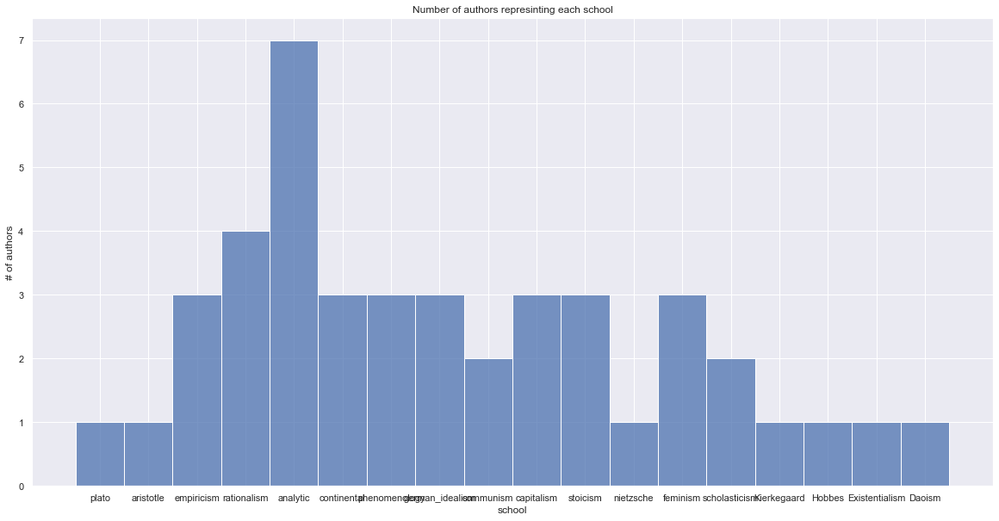

In [646]:
authors_per_school = raw_df.loc[:, ['school', 'author']].drop_duplicates()
authors_per_school_count = authors_per_school['school'].value_counts()
authors_per_school_count
sns.set(rc={'figure.figsize':(20,10)})
p = sns.histplot(data=authors_per_school, x="school")
p.set(ylabel='# of authors')
p.set(title='Number of authors represinting each school')

path = "../figs/authors_per_school.png".format(title)
plt.savefig(path, bbox_inches="tight")

plt.show()

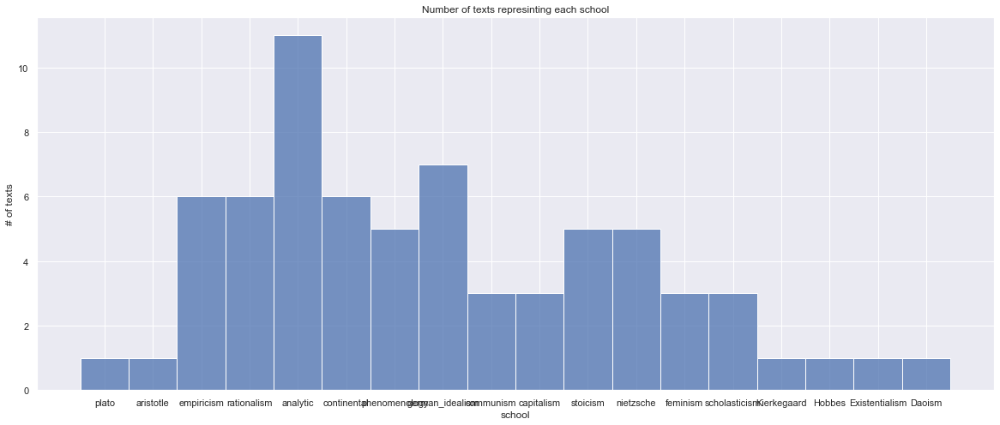

In [638]:
books_per_school = raw_df.loc[:, ['school', 'title']].drop_duplicates()
books_per_school_count = books_per_school['school'].value_counts()

sns.set(rc={'figure.figsize':(20,8)})
p = sns.histplot(data=books_per_school, x="school")
p.set(ylabel='# of texts')
p.set(title='Number of texts represinting each school')

path = "../figs/texts_per_school.png".format(title)
plt.savefig(path, bbox_inches="tight")

plt.show()

In [71]:
"""books_per_author = raw_df.loc[:, ['author', 'title']].drop_duplicates()
books_per_author_count = books_per_author['author'].value_counts()
books_per_author_count
sns.set(rc={'figure.figsize':(6,10)})
p = sns.histplot(data=books_per_author, y="author")
p.set(xlabel='# of texts')
plt.show()"""

'books_per_author = raw_df.loc[:, [\'author\', \'title\']].drop_duplicates()\nbooks_per_author_count = books_per_author[\'author\'].value_counts()\nbooks_per_author_count\nsns.set(rc={\'figure.figsize\':(6,10)})\np = sns.histplot(data=books_per_author, y="author")\np.set(xlabel=\'# of texts\')\nplt.show()'

Given that Plato -the founder of the Plato school of philosophy- has largely contributed to the idea of Laconian speech (i.e., brevity or terseness of expression), it would be interesting to perfrom an analysis on the lenght of the sentences per school to see whether there is a trend on the level of laconism.  

As shown in the following graph, the plato school of thought -that is actually the oldest one- indeed has a quite low average sentence length. At the same time, Hobbes has the largest average sentence length, which makes sense considering that Hobbes was very expressive, with the core of his conception of language being the possibility of creating things with words.  

If we take into consideration the period of time each philosophical school spans (oldest: plato, most recent: analytic, continental, feminism), we can safely conclude that there is no correlation between the time period and the level of laconism.

In [105]:
"""raw_df['created_sentence_length'] = raw_df.apply(lambda row: len(row.sentence_str.split()), axis=1)
avg_sentence_length_per_school = raw_df.groupby('school')['created_sentence_length'].mean().reset_index().rename(columns={'mean':'created_sentence_length'})
sns.set(rc={'figure.figsize':(20,8)})
p = sns.barplot(data=avg_sentence_length_per_school, x="school", y="created_sentence_length")
p.set(ylabel='average sentence length')
p.set(title='Average sentence length per school (in chornological order)')
plt.show()"""

'raw_df[\'created_sentence_length\'] = raw_df.apply(lambda row: len(row.sentence_str.split()), axis=1)\navg_sentence_length_per_school = raw_df.groupby(\'school\')[\'created_sentence_length\'].mean().reset_index().rename(columns={\'mean\':\'created_sentence_length\'})\nsns.set(rc={\'figure.figsize\':(20,8)})\np = sns.barplot(data=avg_sentence_length_per_school, x="school", y="created_sentence_length")\np.set(ylabel=\'average sentence length\')\np.set(title=\'Average sentence length per school (in chornological order)\')\nplt.show()'

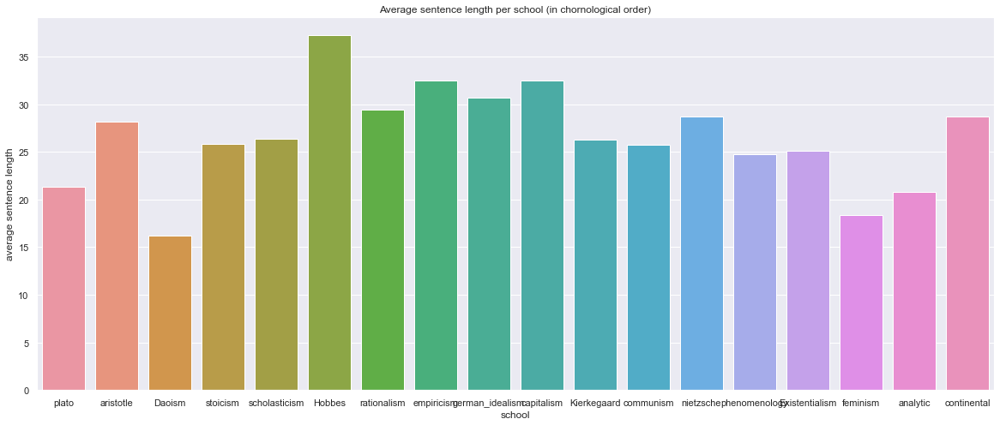

In [644]:
dataset_sorted = raw_df.sort_values(by=['original_publication_date'])
intermediate_df = dataset_sorted.groupby("school")['created_sentence_length' , 'original_publication_date' ].mean()
intermediate_df = intermediate_df.reset_index()
intermediate_df = intermediate_df.sort_values(by=['original_publication_date'])
sns.set(rc={'figure.figsize':(20,8)})
p = sns.barplot(data=intermediate_df, x="school", y="created_sentence_length")
p.set(ylabel='average sentence length')
p.set(title='Average sentence length per school (in chornological order)')

path = "../figs/length_per_school.png".format(title)
plt.savefig(path, bbox_inches="tight")

plt.show()


### Data preprocessing

Before analyzing the data and trying to answer the questions mentioned in the beginning of this blog, it is important to perform data cleaning and make the content suitable for our analysis.  

For the purposes of this project, it was decided that the following cleaning should be performed:
- all punctuation marks should be removed  
- all english stopwords as well as some words (e.g., list, say, one, therefore) that are used many times in the texts but do not add value to the analysis from a philosophical point of view should be removed
- the sentences should be tokenized and lemmatized. Since our analysis is heavily based on the most used words in each text/school, we need to use lemmatization to do morphological analysis and group together the different forms of a word so that they can be analyzed as a single item. Although the creator of the dataset has tokenized and lemmatized the sentences, we decided to redo that processing for data integrity.

In [9]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/silvia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/silvia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/silvia/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/silvia/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/silvia/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [10]:
processed_df = raw_df

In [11]:
processed_df['created_lowered_sentence'] = raw_df.apply (lambda row: row.sentence_str.lower(), axis=1)

In [13]:
def remove_punctuation(text):
     punctuations = '''!()[]{};«№»:'"\,`<>./?@=#$-(%^)+&[*_]~'''
     no_punct = ""
     for char in text:
        if char not in punctuations:
            no_punct = no_punct + char
     return no_punct

processed_df['created_lowered_sentence'] = raw_df.apply(lambda row: remove_punctuation(row.created_lowered_sentence), axis=1)

In [14]:
tokenizer = nltk.RegexpTokenizer(r"\w+") #remove punctuation marks when tokenizing
processed_df['created_tokenized_sentence'] = raw_df.apply (lambda row: tokenizer.tokenize(row.created_lowered_sentence), axis=1)

In [15]:
def remove_stopwords(word_tokens):
    stop_words = set(stopwords.words('english'))
    return [w for w in word_tokens if w.lower() not in stop_words]

processed_df['tokens_without_stop_words'] = processed_df.apply(lambda row: remove_stopwords(row.created_tokenized_sentence), axis=1)

In [16]:
def lem_sentence(word_tokens):
    pos_map = {'J': 'a', 'N': 'n', 'R': 'r', 'V': 'v'}
    pos_tags_list = pos_tag(word_tokens)
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(w, pos=pos_map.get(p[0], 'v')) for w, p in pos_tags_list]

processed_df['lemmatized_tokens'] = processed_df.apply(lambda row: lem_sentence(row.tokens_without_stop_words), axis=1)

In [23]:
additional_stop_words = ['go', 'sure', 'new', 'list', 'back', 'say', 'one', 'two', 'without', 'much',
                        'whose', 'therefor', 'first', 'within', 'yet', 'would', 'also', 'second', 'whats',
                        'us', 'secondly', 'may', 'upon', 'more', 'thus', 'mine', 'thou', 'thy', 'thee', 'dont']

def remove_additional_stopwords(word_tokens):
    stop_words = set(additional_stop_words)
    return [w for w in word_tokens if w.lower() not in stop_words]

processed_df['lem_tokens_without_additional_stop_words'] = processed_df.apply(
    lambda row: remove_additional_stopwords(row.lemmatized_tokens), axis=1
)
processed_df['lem_sentence_without_additional_stop_words'] = processed_df.apply(
    lambda row: " ".join(row.lem_tokens_without_additional_stop_words), axis=1
)

In [579]:
# create data frame with the important columns

important_columns = ["title", "author", "school",
                 "original_publication_date", "corpus_edition_date",
                 "created_lowered_sentence", "lem_sentence_without_additional_stop_words"]

df = processed_df.loc[:, important_columns].copy(deep=True)

### Wordclouds

Let's now try to understand the main ideas and characteristics of each school of thought as well as the differences in thought and positions between the schools. To do so we will figure out the words that are the most frequent in the texts representing each school. Having removed some very common words -known as stopwords- we expect to encounter meaningful words that are indicative of the philosophical ideas of each school.

In [580]:
def display_wordcloud(data, title, color='white', save_fig_path=None):
    wordcloud = WordCloud(background_color=color,
                      stopwords = set(STOPWORDS),
                      max_words=400,
                      max_font_size=60,
                      scale=3,
                      random_state=42
                      ).generate(data)
    fig = plt.figure(1, figsize=(10, 10))
    plt.imshow(wordcloud)
    plt.axis("off")
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.show()
    
    path = "../figs/wordcloud-{}.png".format(title)
    fig.savefig(path, bbox_inches="tight")

The following wordcloud are visual representations of the most common words in the texts of each school, where the size of the fonds indicates the importance of the word. The wordclouds showcase the differences between schools, not only in terms of ideas but also in terms of writing style.

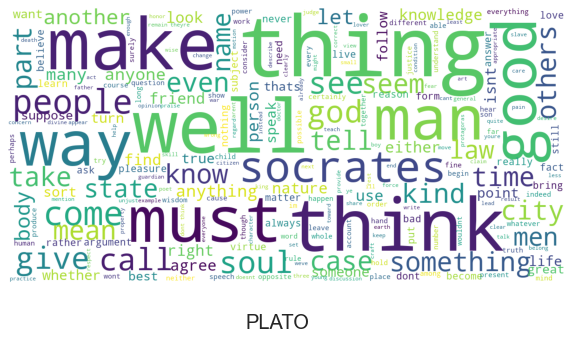

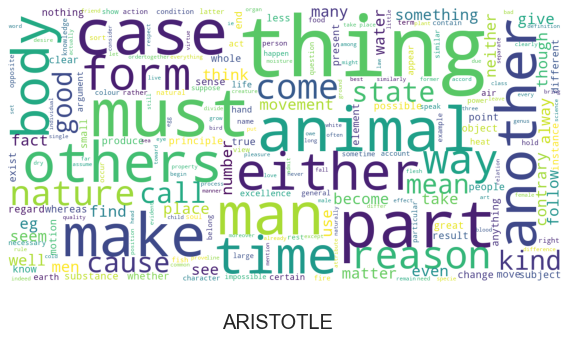

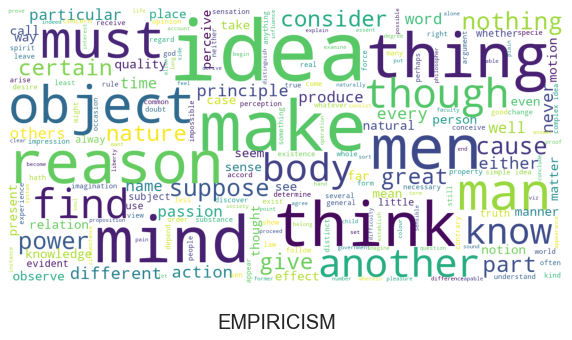

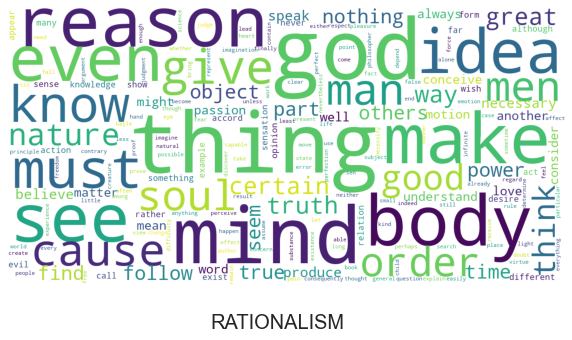

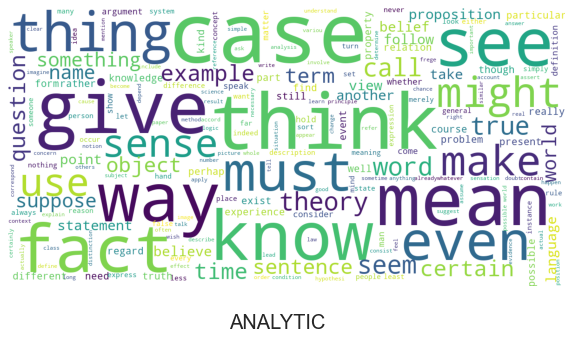

...

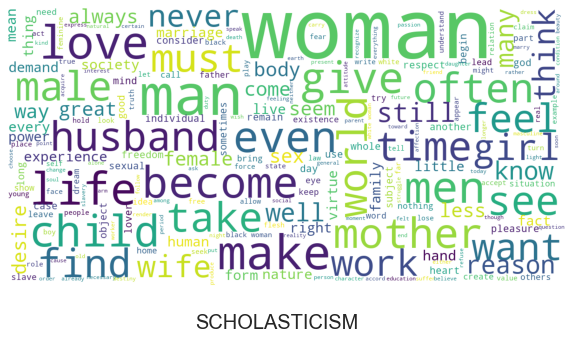

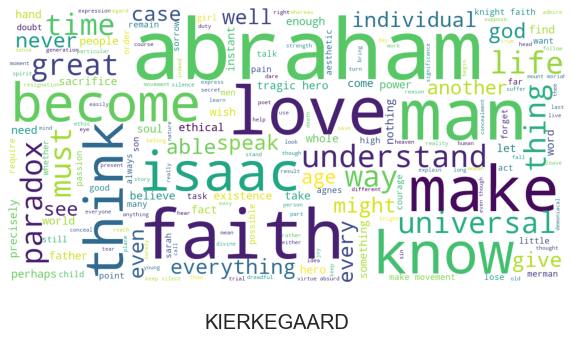

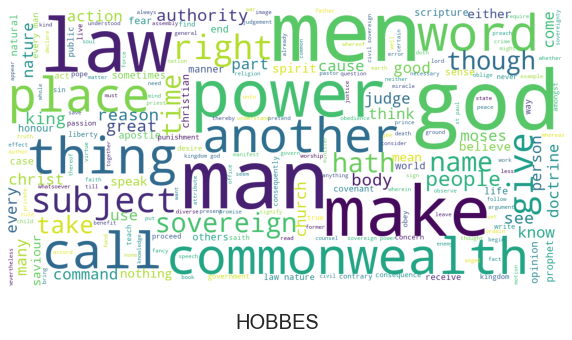

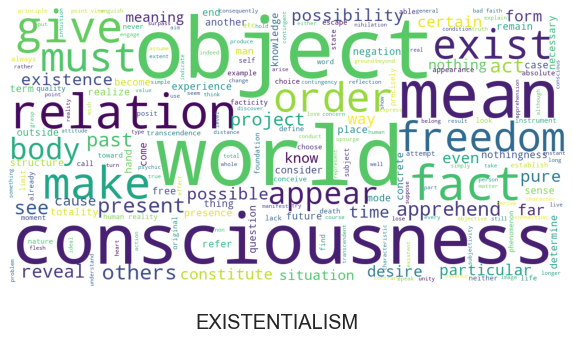

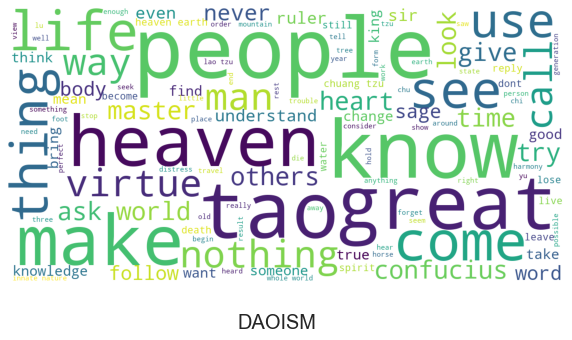

In [581]:
# worldclouds by school
schools = df["school"].unique()
for school in schools:
    school_title = school.replace("_", " ").upper()
    df_temp = df[df.school==school]
    text = " ".join(txt for txt in df_temp.lem_sentence_without_additional_stop_words)
    display_wordcloud(text, school_title)

Let's now discuss the idea behind each school as revealed by the wordcloud and compare it with our knowledge about the respective philosophical view. We will discuss the schools in chronological order.

- Plato: Some of the most used words are think, man, good, well, even, give. Plato the founder of the plato school was an advocate of justice, which is exactly what these words indicate.
- Aristotle: Some of the most used words are animal, man body, reason, case, and cause, words that indicate rationality. Aristotle was indeed a supporter of reasoning. 
- Daoism: tao and heaven underline harmony and natural order. At the same time, sage and people could indicate patience and compassion towards the others.
- Stoicism: as indicated by the wordcloud the main ideas of stoicism are wisdom (mind), justice (truth), and courage (soul).
- Hobbes: exist, existence, freedom, order, relation underline Hobbes's concern: the sociopolical problem, i.e., how can people live together in communities peacefully?
- Rationalism: Some of the most common words are mind, idea, know, reason, and think. The usage of these words bolsters the idea that all aspects of life can be grasped through logical principles.
- Empiricism: Words such as idea, body, object, reason, make, and produce indicate evidence, experience. That is exactly what empiricism is about, the idea that all concepts originate in experience.
- German idealism: concept, consciousness, determination, think, reason and nature are words commonly used among the german idealists. If we compare these words to the ones used in empiricism we can understand that german idealism contradicst empriricms by supporting that all knowledge comes from the mind.
- Capitalism: some of the most common words are capital, money, tax, proffit, pay, and interest. All these words underline that capitalism's ideas are private property, profit, and market compettion.
- Kierkegaard: words like faith, abraham, isaac, love, god, man reveal the belief that people should have total faith in god.
- Communism: words like work, worker, hand, machinery, and labourer refer to the working class, the proletariat as called in communism. On the ther hand, capital opposes to capitalism.
- Nietzsche: Good, virtue, and great as some of the dominant words in the texts of the nietzsche school. that could mean that the philosophers of that schools wrote extensively about good and probably about evil as well. Man, life, mind, god supports the concept of self-realization and the idea that god does not exist.
- Phenomenology: think, experience, consiounsness, sense, perception. All these words reveal that phenomenology studies phenomena that have been experienced consciously.
- Feminism: this school of philosophy strived to understand and also challenge women's opperssion as revelaed by words such as even, become, and zarathustra.
- Analytic: think, case, know, fact, theory, and question show that the philoshopers of the analytic school were supporters of logics and reasons. At the same time, term, word, and sentence reveals that the analytic school is characterized by an emphasis on linguistics. 
- Continental:  this school of thorugt is all about politics, desire, and freedom as indicated by the words form, man, must, order, and relation.

Beside the different ideas behind each school of philosophy, how do these schools differ in terms of writing style? It is clear that the philosopers of the older schools used words that are now antiquated.

So what are some of the main philosophical categories? idealism, rationality, spirituality, religion, sociopolitics, capitalism vs communism, feminism

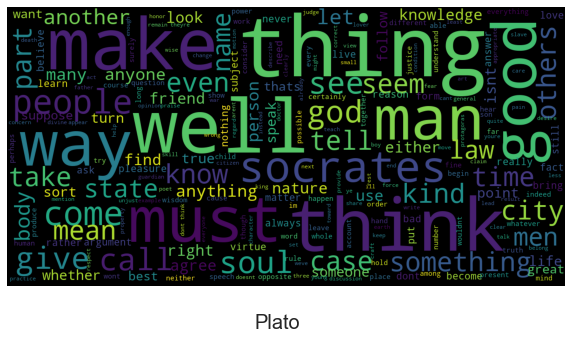

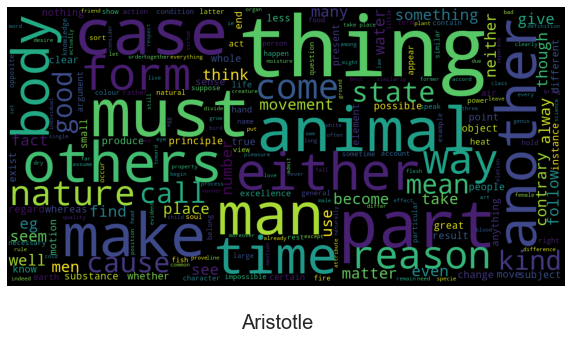

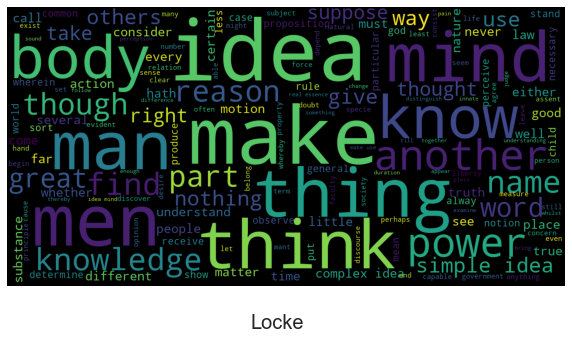

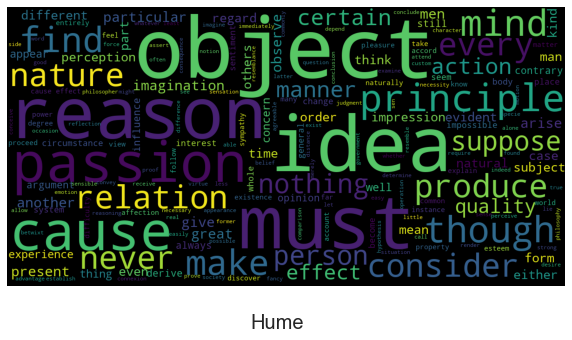

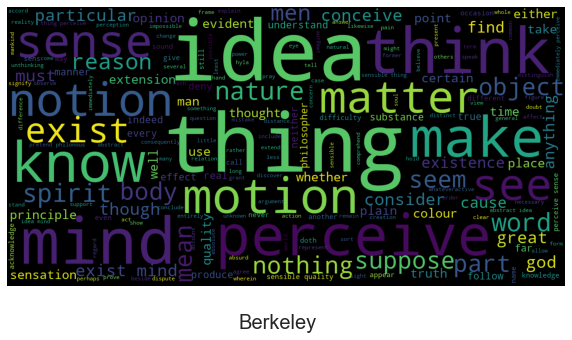

...

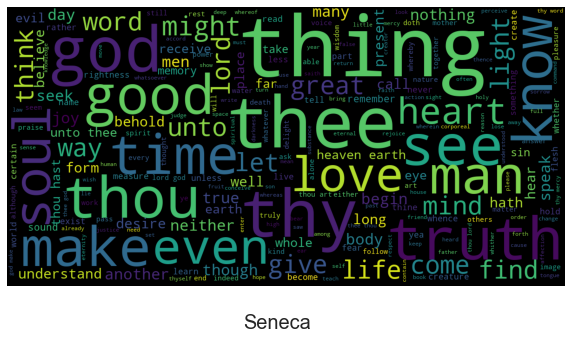

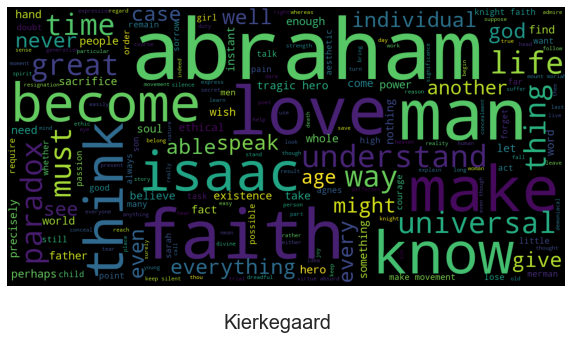

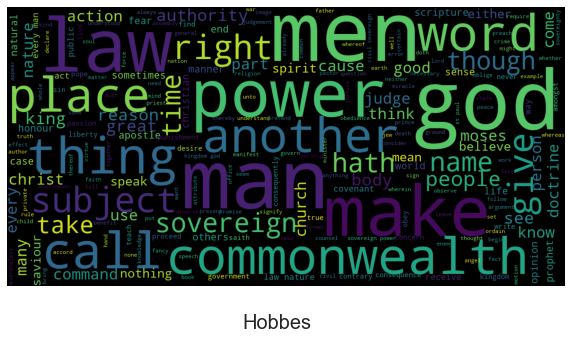

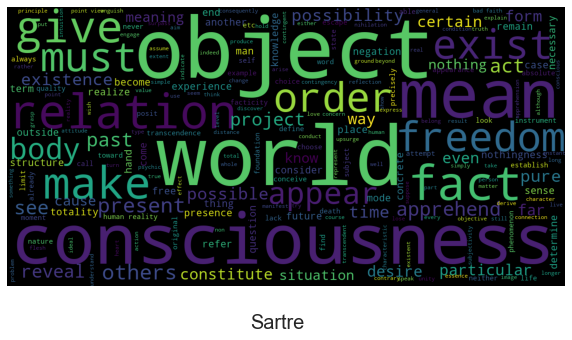

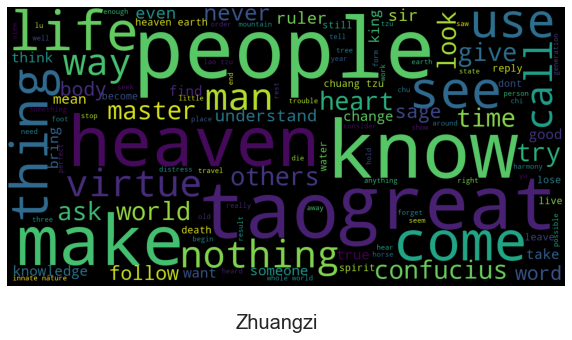

In [44]:
# worldclouds by author
authors = df["author"].unique()
for author in authors:
    #author_title = school.replace("_", " ").upper()
    df_temp = df[df.author==author]
    text = " ".join(txt for txt in df_temp.lem_sentence_without_additional_stop_words)
    display_wordcloud(text, author, 'black')

### Topic Modeling

In [582]:
titles = df['title'].unique()
titles_text = {}

for title in titles:
    df_title = df[(df.title==title)]
    text = ' '.join(df_title['lem_sentence_without_additional_stop_words'])
    titles_text[title] = [text]
    
texts_df = pd.DataFrame(data=titles_text)
texts_df = texts_df.T

dataLDA = texts_df[0].values.tolist()

In [32]:
import os
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [567]:
additional_stop_words = ['go', 'sure', 'new', 'list', 'back', 'say', 'one', 'two', 'without', 'much',
                        'whose', 'therefor', 'first', 'within', 'yet', 'would', 'also', 'second', 'whats',
                        'us', 'secondly', 'may', 'upon', 'more', 'thus', 'mine', 'thou', 'thy', 'thee', 'dont', 'eg', 'isnt', 'doesnt',
                        'thats']

In [628]:
st = stopwords.words('english')
st.extend(additional_stop_words)

tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                analyzer = 'word',
                                stop_words = st,
                                lowercase = True,
                                max_df=0.8, min_df=0.015)
dtm_tf = tf_vectorizer.fit_transform(dataLDA)

num_components=6
# Create LDA object
model=LatentDirichletAllocation(n_components=num_components, random_state=5)
# Fit and Transform SVD model on data
lda_matrix = model.fit(dtm_tf)
# Get Components 
lda_components=model.components_

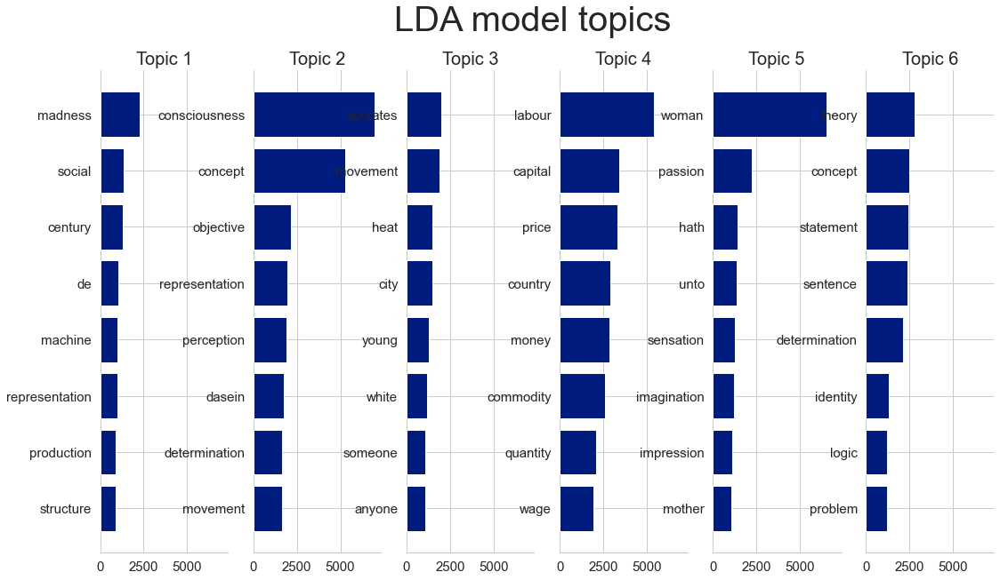

In [629]:
def top_words_per_topic(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(1, 6, figsize=(18, 10), sharex=True)
    axes = axes.flatten()
    for index, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        counts = topic[top_features_ind]
        ax = axes[index]
        ax.barh(top_features, counts, height=0.8)
        ax.set_title(f"Topic {index+1}", fontdict={"fontsize": 20})
        ax.invert_yaxis()
        ax.tick_params(labelsize=15)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

plt.show()
feature_names = tf_vectorizer.get_feature_names()
top_words_per_topic(model, feature_names, 8, "LDA model topics")

In [621]:
doc_topic = model.transform(dtm_tf)
documents_topics_dict = {}
for n in range(doc_topic.shape[0]):
    topic_most_pr = doc_topic[n].argmax()
    documents_topics_dict[titles[n]] = topic_most_pr

In [622]:
schools_topics = df.loc[:, ['school', 'title']].drop_duplicates()
schools_topics['title'] = schools_topics.apply (lambda row: documents_topics_dict[row.title]+1, axis=1)
schools_topics.drop_duplicates()

,school,title
0,plato,2
38366,aristotle,2
87145,empiricism,2
107076,rationalism,2
130025,analytic,3
133538,analytic,4
185450,continental,3
219229,phenomenology,3
231653,phenomenology,1
247802,german_idealism,1


In [339]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

In [598]:
pyLDAvis.sklearn.prepare(model, dtm_tf, tf_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.088738 -0.107294       1        1  21.860419
0     -0.175989  0.021317       2        1  21.447868
4      0.161656  0.154484       3        1  21.281348
1      0.081059 -0.094498       4        1  19.908643
2     -0.155464  0.025992       5        1  15.501721, topic_info=                Term         Freq        Total Category  logprob  loglift
5279         concept  7952.000000  7952.000000  Default  30.0000  30.0000
32799          woman  7655.000000  7655.000000  Default  29.0000  29.0000
16322         labour  5597.000000  5597.000000  Default  28.0000  28.0000
5548   consciousness  7301.000000  7301.000000  Default  27.0000  27.0000
7386   determination  4028.000000  4028.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
26131      sensation   896.373046  2754.381416   Topic5  -5.8254   0.7416
4594           class   796.214192  3093.257207   Topic5  -5.9439   0.5071
6646              de   760.300543  2617.409840   Topic5  -5.9900   0.6280
13814       identity   700.350640  2438.419996   Topic5  -6.0722   0.6167
18885       movement   586.940856  5221.611611   Topic5  -6.2488  -0.3214

[424 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
220        1  0.118341   accordance
220        2  0.747568   accordance
220        3  0.110403   accordance
220        4  0.004330   accordance
220        5  0.019483   accordance
...      ...       ...          ...
33062      2  0.043374  zarathustra
33062      4  0.955786  zarathustra
33086      1  0.958362         zeus
33086      2  0.031138         zeus
33086      4  0.006920         zeus

[1140 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 5, 2, 3])

### Sentiment Analysis

From our so far analysis, we can reason that there are topics (e.g., labor, reason, mind, soul) that characterize some of the schools. However, although some philoshophers are in favor of some of those topics some others are against them. For example, Kierkegaard supports the idea that people should have total faith in god, while the Nitzsche school is of the opinion that god doesn't exist. So, wouldn't it be interesting to figure out how the philosophical stance or else the emotions of the philosophers towards those topics have changed over time?

Emotions are associated with thoughts, feelings, and behavioral responses. The evolution of the world, causes people to respond in different way to the same topics during the course of the time. One would wonder: how can we understand how people’s emotions towards specific topics (e.g., god, mind, soul) have changed over time? By performing sentiment analysis and classifying prominent words into emotion categories (categories: Happy, Angry, Surprise, Sad, Fear).

In [50]:
!pip3 install text2emotion
import text2emotion as te

You should consider upgrading via the '/usr/local/opt/python@3.9/bin/python3.9 -m pip install --upgrade pip' command.


In [ ]:
all_data_sentiment_dict = {}

In [296]:
dataset_sentiment = df.loc[:,['school','author','title','original_publication_date','lem_sentence_without_additional_stop_words']]
words = ['labor', 'reason', 'mind', 'soul', 'god', 'woman']
word_sentiment_analysis = {}
schools = df["school"].unique()

In [297]:
for word in words:   
    dataset_sentiment['exists'] = dataset_sentiment['lem_sentence_without_additional_stop_words'].str.contains(word)
    data = dataset_sentiment[dataset_sentiment['exists'] == True]
    data['sentiment'] = data['lem_sentence_without_additional_stop_words'].apply(lambda s: te.get_emotion(s))
    word_sentiment_analysis[word] = data

In [300]:
for word in words:
    data_word = word_sentiment_analysis[word]
    sentiment_dictionary = data_word["sentiment"].apply(pd.Series)
    all_data_sentiment = pd.concat([data_word, sentiment_dictionary], axis=1).drop('sentiment', axis=1)
    ds_sorted = all_data_sentiment.sort_values(by=['original_publication_date'])
    data_sentiment_mean = all_data_sentiment.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear', 'original_publication_date' ].mean()
    data_sentiment_mean = data_sentiment_mean.reset_index()
    data_sentiment_mean = data_sentiment_mean.sort_values(by=['original_publication_date'])
    data_sentiment_mean['Angry'] = data_sentiment_mean.apply (lambda row: row.Happy + row.Angry, axis=1)
    data_sentiment_mean['Surprise'] = data_sentiment_mean.apply (lambda row: row.Surprise + row.Angry, axis=1)
    data_sentiment_mean['Sad'] = data_sentiment_mean.apply (lambda row: row.Surprise + row.Sad, axis=1)
    data_sentiment_mean['Fear'] = data_sentiment_mean.apply (lambda row: row.Fear + row.Sad, axis=1)
    all_data_sentiment_dict[word] = data_sentiment_mean

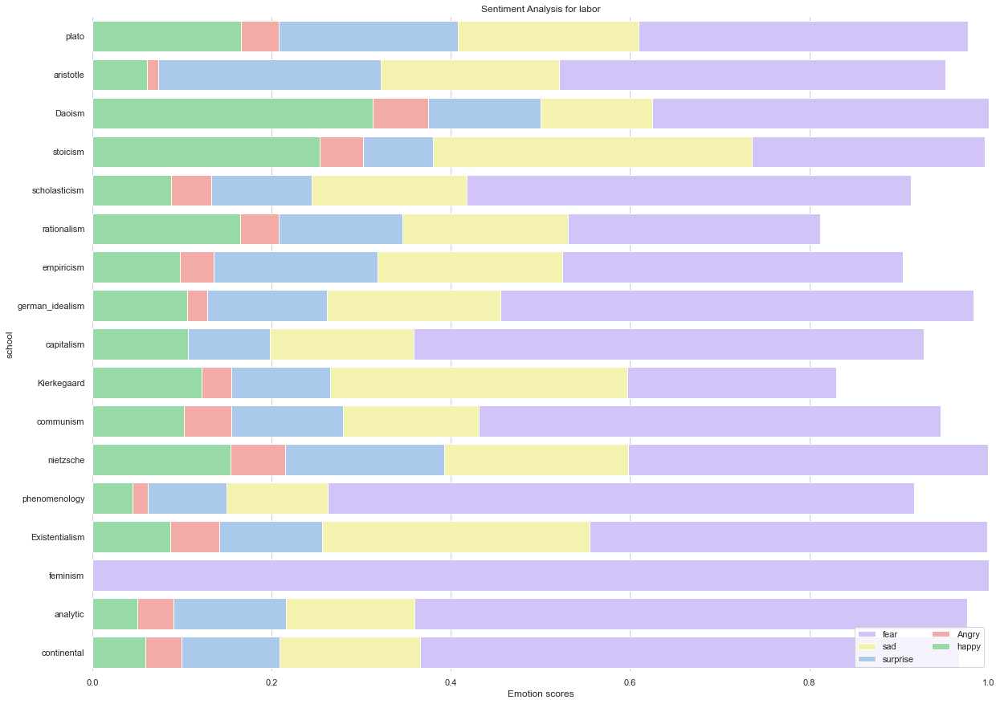

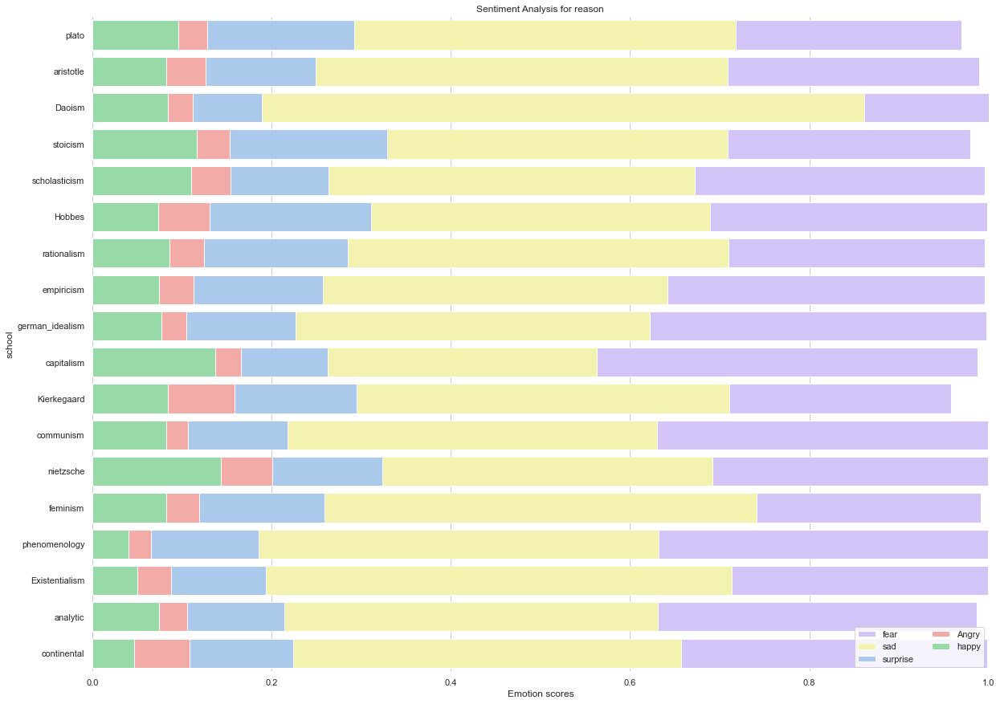

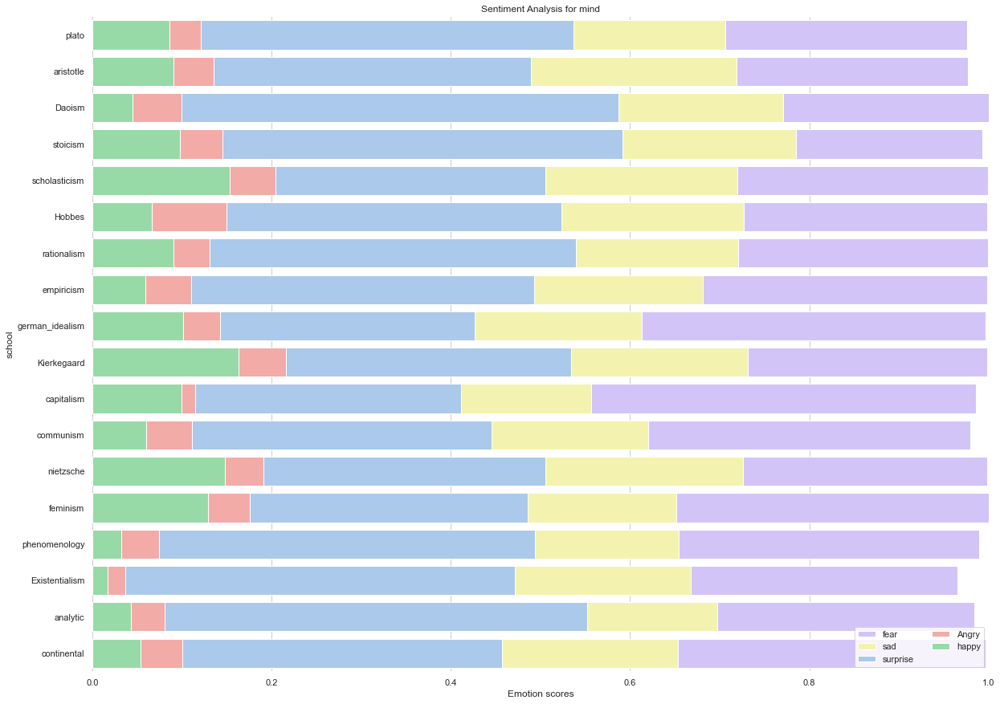

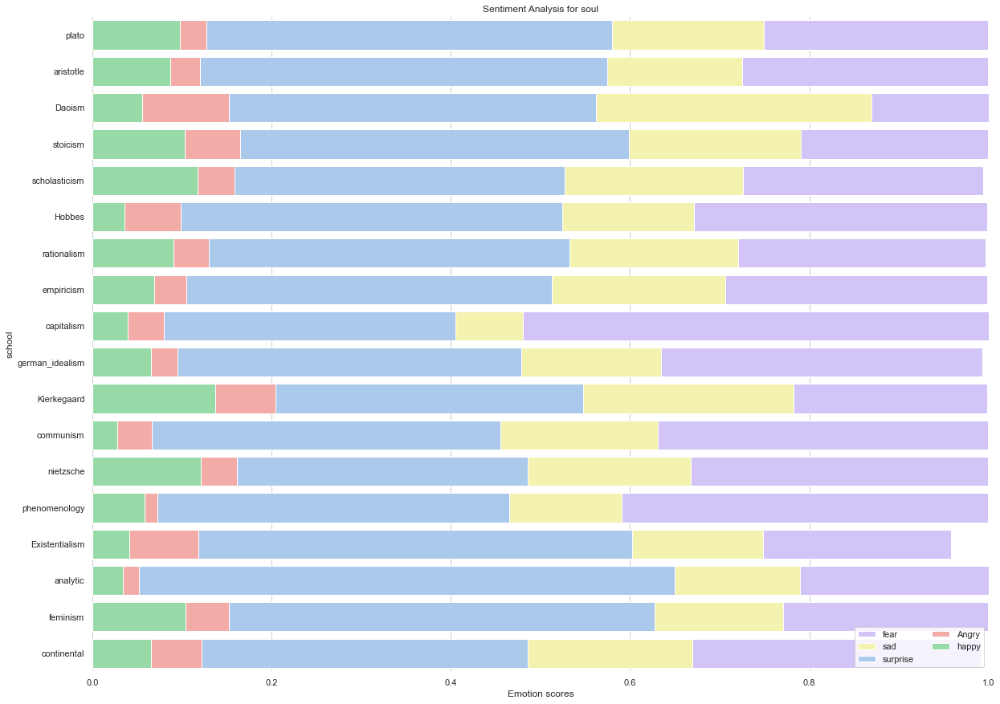

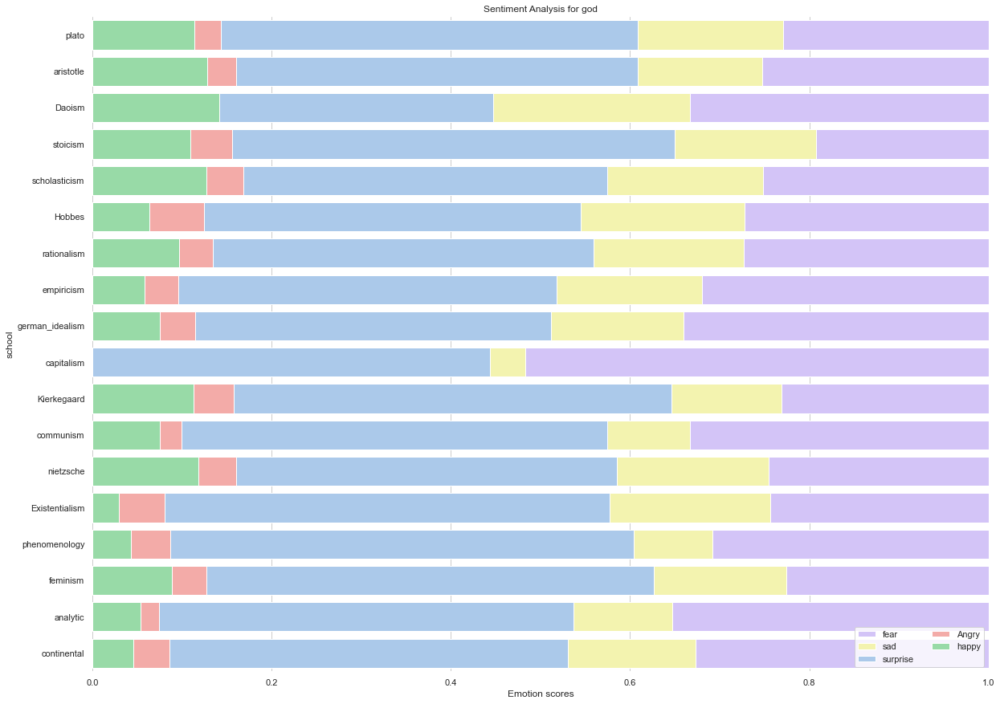

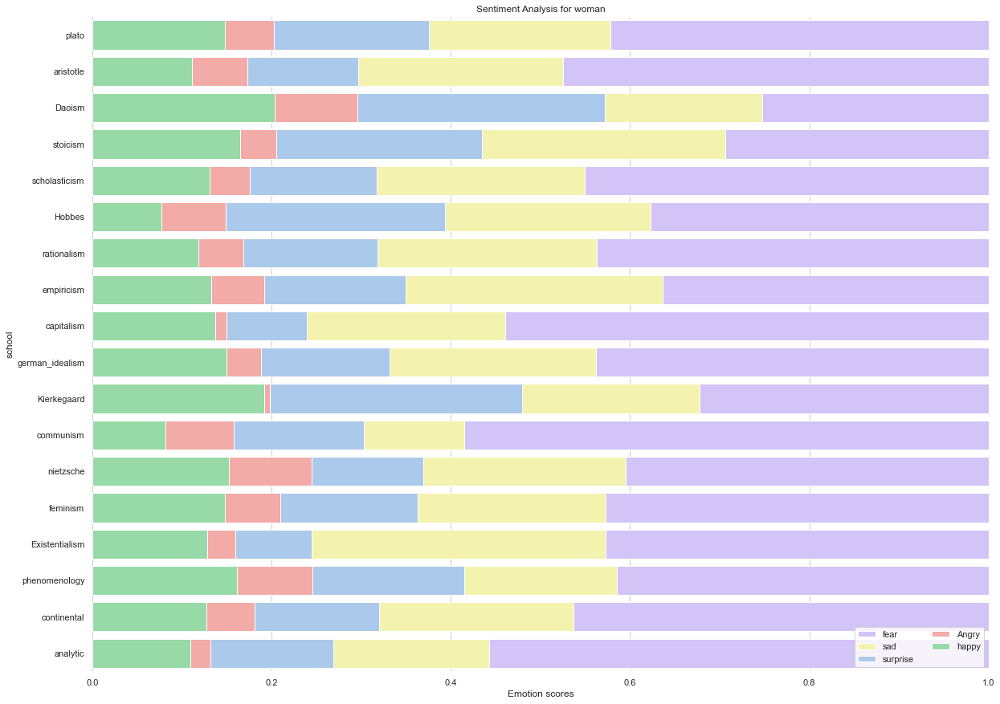

In [635]:
for word in ['labor', 'reason','mind', 'soul', 'god', 'woman']:
    sns.set_theme(style="whitegrid")

    f, ax = plt.subplots(figsize=(20, 15))
    plot_data = all_data_sentiment_dict[word]

    sns.set_color_codes("pastel")
    sns.barplot(x="Fear", y="school", data=plot_data,
                label="fear", color="m")
    sns.barplot(x="Sad", y="school", data=plot_data,
                label="sad", color="y")
    sns.barplot(x="Surprise", y="school", data=plot_data,
                label="surprise", color="b")
    sns.barplot(x="Angry", y="school", data=plot_data,
                label="Angry", color="r")
    sns.barplot(x="Happy", y="school", data=plot_data,
                label="happy", color="g")

    ax.legend(ncol=2, loc="lower right", frameon=True)
    ax.set(xlim=(0, 1), ylabel="school",
           xlabel="Emotion scores")
    ax.set(title='Sentiment Analysis for {}'.format(word))
    sns.despine(left=True, bottom=True)
    
    path = "../figs/sentiment-{}.png".format(word)
    ax.figure.savefig(path, bbox_inches="tight")


In [61]:
data['sentiment'][59]

{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.2, 'Sad': 0.2, 'Fear': 0.1}

In [60]:
data['sentiment']

21       {'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.67,...
59       {'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.2, ...
65       {'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...
67       {'Happy': 0.33, 'Angry': 0.0, 'Surprise': 0.33...
72       {'Happy': 0.25, 'Angry': 0.0, 'Surprise': 0.25...
                               ...                        
38275    {'Happy': 0.0, 'Angry': 0.38, 'Surprise': 0.38...
38281    {'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33,...
38342    {'Happy': 0.1, 'Angry': 0.1, 'Surprise': 0.7, ...
38351    {'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.5, ...
38352    {'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...
Name: sentiment, Length: 1390, dtype: object